In [ ]:
!pip install -U fastai

In [150]:
pip install tensorflow_addons

     -------------------------------------- 729.9/729.9 kB 5.1 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [310]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import random


from PIL import Image
import cv2

from PIL import Image
from PIL import ImageEnhance
from PIL import ImageFilter as Filter

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
import tensorflow_addons as tfa
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import InputLayer, Conv2D, MaxPooling2D, Input, Activation, Add, ReLU
from tensorflow.keras.layers import BatchNormalization, Dropout, AveragePooling2D, Dense, Flatten, Concatenate
from tensorflow.keras.activations import relu, softmax
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.image import ImageDataGenerator


In [311]:
#Some Global Variables
epochs = 200
lr = 1e-3
valid_split = 0.2
input_size = 224
batch_size = 32
classes = 22
initializer = tf.keras.initializers.HeUniform()
optimizer = tf.keras.optimizers.Nadam(learning_rate=lr)
loss = tf.keras.losses.categorical_crossentropy
weight_decay = 5e-4

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [312]:
#path to training images
INPUT_PATH = "archive/images/train/"


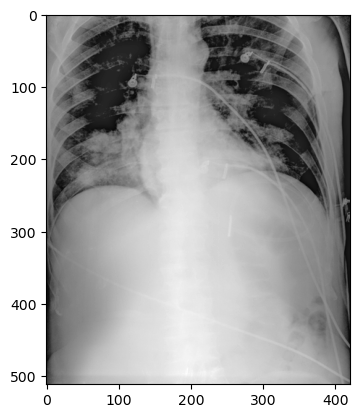

In [313]:
#Firstly We are working on a simple image and test preprocessing option on the sample image, then we will\
#which options we will use for final evaluation

im = plt.imread( INPUT_PATH + "1.2.826.0.1.3680043.8.498.10184934709444914820743565430950640871-c.png")
plt.imshow(im, cmap='gray') #cmap ==> colormap as it is grayscale image 

In [314]:
#CSV files containing other parameters about images
df_train = pd.read_csv(Path("archive", "train_df.csv"))
df_train.head()



,SOPInstanceUID,Target,MultiImageType,ImageType,ImageType1,InstanceCreationDate,InstanceCreationTime,SOPClassUID,StudyDate,SeriesDate,...,WindowWidth,ImageType2,KVP,DistanceSourceToDetector,DistanceSourceToPatient,ExposureTime,XRayTubeCurrent,AcquisitionNumber,ImageType3,image_path
0,1.2.826.0.1.3680043.8.498.10025629581362719970...,0,1.0,ORIGINAL,PRIMARY,NaN,NaN,1.2.840.10008.5.1.4.1.1.1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,./images/train/1.2.826.0.1.3680043.8.498.10025...
1,1.2.826.0.1.3680043.8.498.10036150326276641158...,15,1.0,ORIGINAL,PRIMARY,NaN,NaN,1.2.840.10008.5.1.4.1.1.1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,./images/train/1.2.826.0.1.3680043.8.498.10036...
2,1.2.826.0.1.3680043.8.498.10038426859954986240...,12,1.0,ORIGINAL,PRIMARY,NaN,NaN,1.2.840.10008.5.1.4.1.1.1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,./images/train/1.2.826.0.1.3680043.8.498.10038...
3,1.2.826.0.1.3680043.8.498.10050991192143676483...,14,NaN,NaN,NaN,NaN,NaN,1.2.840.10008.5.1.4.1.1.1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,./images/train/1.2.826.0.1.3680043.8.498.10050...
4,1.2.826.0.1.3680043.8.498.10053309524595490852...,3,1.0,ORIGINAL,PRIMARY,NaN,NaN,1.2.840.10008.5.1.4.1.1.1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,./images/train/1.2.826.0.1.3680043.8.498.10053...


In [315]:
print(df_train['Target'].dtype) #string
df_train['Target'] = df_train['Target'].apply(lambda x: x.strip()) #It removes any leading or following spaces

object


In [316]:
df_train.head()

,SOPInstanceUID,Target,MultiImageType,ImageType,ImageType1,InstanceCreationDate,InstanceCreationTime,SOPClassUID,StudyDate,SeriesDate,...,WindowWidth,ImageType2,KVP,DistanceSourceToDetector,DistanceSourceToPatient,ExposureTime,XRayTubeCurrent,AcquisitionNumber,ImageType3,image_path
0,1.2.826.0.1.3680043.8.498.10025629581362719970...,0,1.0,ORIGINAL,PRIMARY,NaN,NaN,1.2.840.10008.5.1.4.1.1.1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,./images/train/1.2.826.0.1.3680043.8.498.10025...
1,1.2.826.0.1.3680043.8.498.10036150326276641158...,15,1.0,ORIGINAL,PRIMARY,NaN,NaN,1.2.840.10008.5.1.4.1.1.1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,./images/train/1.2.826.0.1.3680043.8.498.10036...
2,1.2.826.0.1.3680043.8.498.10038426859954986240...,12,1.0,ORIGINAL,PRIMARY,NaN,NaN,1.2.840.10008.5.1.4.1.1.1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,./images/train/1.2.826.0.1.3680043.8.498.10038...
3,1.2.826.0.1.3680043.8.498.10050991192143676483...,14,NaN,NaN,NaN,NaN,NaN,1.2.840.10008.5.1.4.1.1.1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,./images/train/1.2.826.0.1.3680043.8.498.10050...
4,1.2.826.0.1.3680043.8.498.10053309524595490852...,3,1.0,ORIGINAL,PRIMARY,NaN,NaN,1.2.840.10008.5.1.4.1.1.1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,./images/train/1.2.826.0.1.3680043.8.498.10053...


In [317]:
training_images_count =  len(os.listdir(INPUT_PATH)) #No. of training Images
print(training_images_count)

<IPython.core.display.Javascript object>

1738


In [318]:
(im.shape) # 512* 420 pixels (helps us deciding the input size to training model)

(512, 420)

In [319]:
test_arr = np.expand_dims(np.asarray(im),2) #It is done to increase the dimension(here converted to 3d as most model take this format as input)
test_arr_rgb = tf.image.grayscale_to_rgb(tf.convert_to_tensor(test_arr))  # tensor ==> tensorflow array

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [320]:
test_arr.shape #3D channel 

(512, 420, 1)

In [321]:
type(test_arr_rgb) #tensor

tensorflow.python.framework.ops.EagerTensor

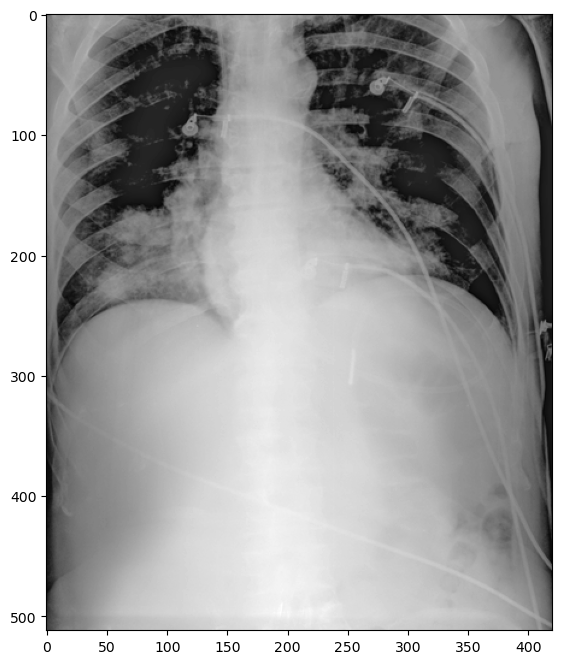

In [322]:
plt.figure(figsize=[8,8], dpi=100)
plt.imshow(test_arr,cmap=plt.cm.gray)

In [ ]:
#Now as we have seen the sample Xray image, it is grayscaled, before turning images to ML model we will apply 
#some image enhancement techniques by applying some filter on the images like contrast, saturation and image enhancements

## Augmentations apply:
#### -edge enhance
#### -de-texturization
#### -filp right-left
#### -flip up-down
#### -random cropping

In [323]:
ada_thold = cv2.adaptiveThreshold(test_arr.astype(np.uint8), 20, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2.01)

In [324]:
laplacian = cv2.Laplacian(test_arr,cv2.CV_64F, ksize=5)

In [325]:
img = Image.open(INPUT_PATH + "1.2.826.0.1.3680043.8.498.10184934709444914820743565430950640871-c.png")

In [326]:
edgeEnahnced = img.filter(Filter.EDGE_ENHANCE_MORE)

In [327]:
de_texturize = cv2.bilateralFilter(im,9,50,50)

(-0.5, 419.5, 511.5, -0.5)

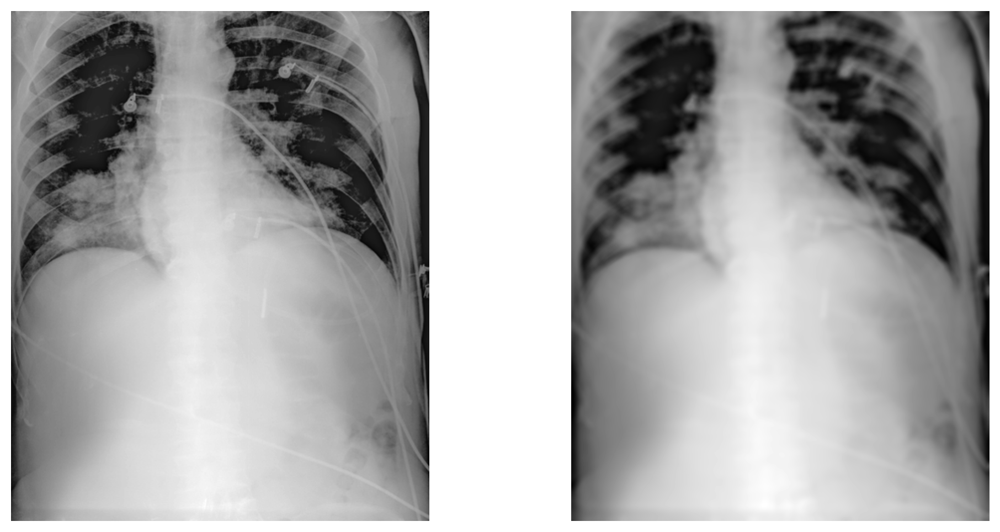

In [328]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=[12,6], dpi=200)
axes = axes.ravel()

axes[0].imshow(test_arr, cmap=plt.cm.gray)
axes[1].imshow(de_texturize,cmap=plt.cm.gray)

axes[0].axis('off')
axes[1].axis('off')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

(-0.5, 419.5, 511.5, -0.5)

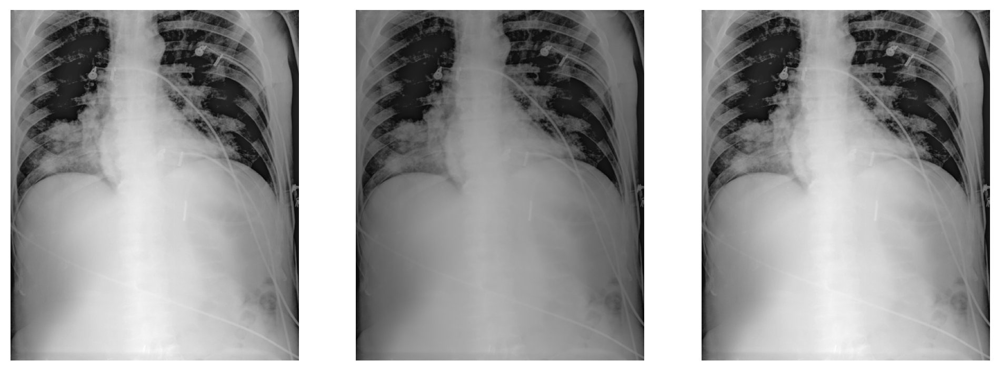

In [329]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=[12,6], dpi=200)
axes = axes.ravel()

axes[0].imshow(test_arr, cmap=plt.cm.gray)
axes[1].imshow(tf.image.adjust_saturation(test_arr_rgb, 2), cmap=plt.cm.gray)
axes[2].imshow(tf.image.adjust_contrast(test_arr, 0.2), cmap=plt.cm.gray)

axes[0].axis('off')
axes[1].axis('off')
axes[2].axis('off')

In [330]:
def edge_enhancing(array):
    method = np.random.choice(['ada_thold', 'laplacian', 'edge_enahnced'])
    
    if method=='ada_thold':     
        return np.expand_dims(cv2.adaptiveThreshold(array, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 1), 2)
    
    elif method=='laplacian':
        return np.expand_dims(cv2.Laplacian(array,cv2.CV_64F, ksize=5), 2)
    
    else:
        image = Image.fromarray(np.squeeze(array, axis=2)).convert('L')
        return np.expand_dims(np.asarray(image.filter(Filter.EDGE_ENHANCE_MORE)), 2)

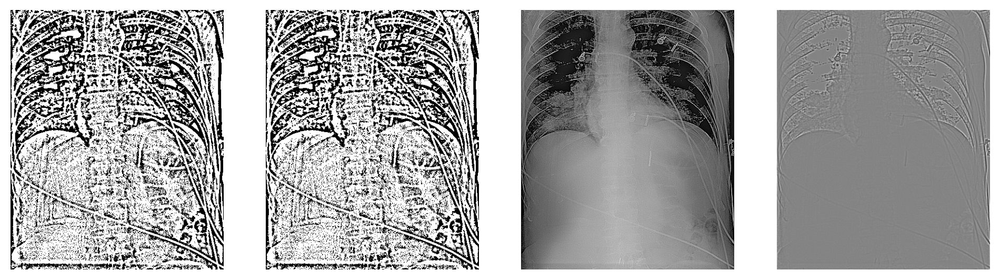

In [331]:
image = img
image_arr = np.expand_dims(np.asarray(image), axis=2)
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=[12,6], dpi=200)
axes = axes.ravel()

for i in range(len(axes)):
    axes[i].imshow(edge_enhancing(image_arr), cmap=plt.cm.gray)
    axes[i].axis('off')

In [332]:
def de_texturization(array):
    n = np.random.choice([5, 9, 13, 15])
    sigma = np.random.choice([50, 65, 75])
    
    return np.expand_dims(cv2.bilateralFilter(array, n, sigma, sigma), 2)

In [333]:
def random_flip(array):    
    if random.choice([True, False]):
        return tf.image.random_flip_left_right(array).numpy()
    else:
        return tf.image.random_flip_up_down(array).numpy()

In [334]:
def tumbnail(array, shape=(512,512)):
    return cv2.resize(array, shape) 

In [335]:
def random_crop(array):
    method = np.random.choice(['left', 'right', 'top', 'down'])
    v_center = array.shape[1]//2
    h_center = array.shape[0]//2
    
    if method == 'left':
        return array[:,:v_center,:]
    elif method == 'right':
        return array[:,v_center:,:]
    elif method == 'top':
        return array[:h_center,:,:]
    elif method == 'down':
        return array[h_center:,:,:]
    else:
        return array

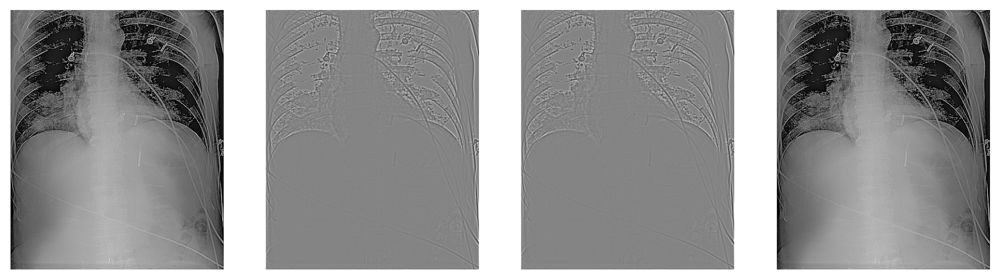

In [336]:
image = img
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=[12,6], dpi=200)
axes = axes.ravel()

for i in range(len(axes)):
    axes[i].imshow(edge_enhancing(image_arr), cmap=plt.cm.gray)
    axes[i].axis('off')


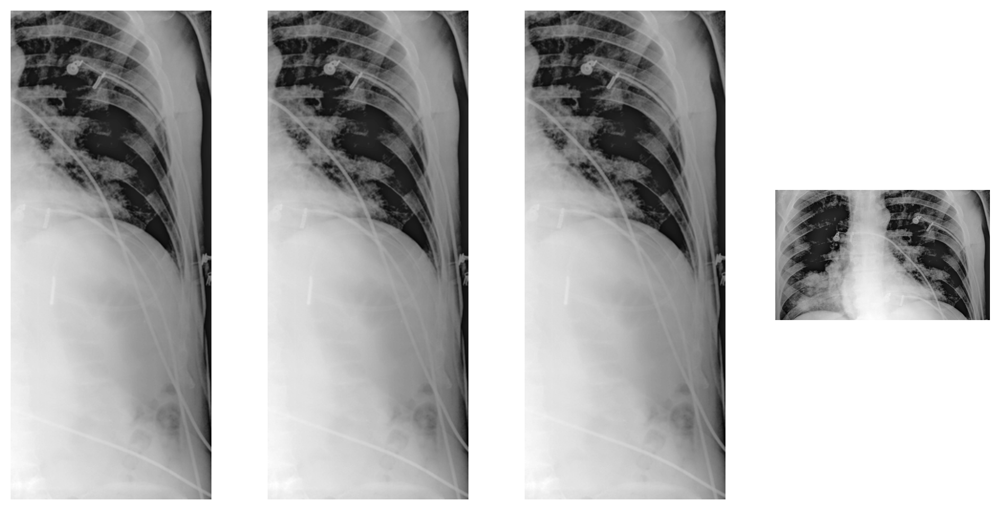

In [337]:
image_arr = np.expand_dims(im, axis=2)
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=[12,6], dpi=200)
axes = axes.ravel()

for i in range(len(axes)):
    axes[i].imshow(random_crop(image_arr), cmap=plt.cm.gray)
    axes[i].axis('off')

In [338]:
def pre_procrssing(image):
    temp = np.asarray(image)
    
    if np.random.choice([True, False], p=[0.45, 0.55]):
        # other augmentaions
        temp = de_texturization(temp)
        
        # crop
        if random.choice([True, False]):
            temp = tf.image.random_crop(temp, (128,128,1)).numpy()
        else:
            temp = random_crop(temp)
        
        temp = tumbnail(temp, (224, 224))

        return np.expand_dims(temp, 2)
    
    else:
        return temp

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

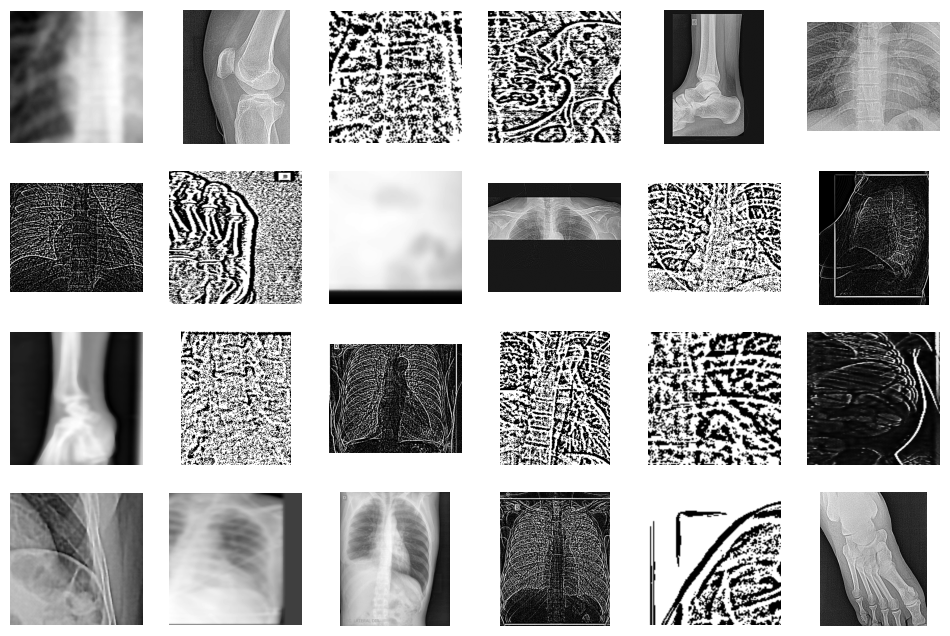

In [367]:
files = os.listdir(INPUT_PATH)
rand_files = random.choices(files, k=24)

fig, axes = plt.subplots(nrows=4, ncols=6, figsize=[12,8], dpi=100)
axes = axes.ravel()

for i in range(len(axes)):
    img = Image.open(os.path.join(INPUT_PATH,rand_files[i]))
    #img =np.squeeze(img)

    img = pre_procrssing(img)
    #img =np.squeeze(img)
    
    axes[i].imshow(img, cmap=plt.cm.gray)
    axes[i].axis('off')

In [340]:
train_df = df_train[['image_path', 'Target']] # These are the only 2 columns we need in the dataset
train_df

,image_path,Target
0,./images/train/1.2.826.0.1.3680043.8.498.10025...,0
1,./images/train/1.2.826.0.1.3680043.8.498.10036...,15
2,./images/train/1.2.826.0.1.3680043.8.498.10038...,12
3,./images/train/1.2.826.0.1.3680043.8.498.10050...,14
4,./images/train/1.2.826.0.1.3680043.8.498.10053...,3
...,...,...
1733,./images/train/1.2.826.0.1.3680043.8.498.99711...,14
1734,./images/train/1.2.826.0.1.3680043.8.498.99727...,11
1735,./images/train/1.2.826.0.1.3680043.8.498.99935...,3
1736,./images/train/1.2.826.0.1.3680043.8.498.99969...,2


In [371]:
#Now there are some images which has been labelled as it belongs to multiple classes, but to input the mode ,we need to clean this data
multi_labels = [i for i, target in enumerate(train_df['Target']) if len(target) > 2]
len(multi_labels)


0

In [342]:
corrected_labels = []
#Take only the first predicted
for ml in multi_labels:    
    corrected_labels.append([train_df.loc[ml, 'image_path'], train_df.loc[ml, 'Target'].split(' ')[0]])

In [343]:
corrected_labels

[['./images/train/1.2.826.0.1.3680043.8.498.10065930002825553435161793347987832017-c.png',
  '13'],
 ['./images/train/1.2.826.0.1.3680043.8.498.10166555243811009418614649510306269973-c.png',
  '9'],
 ['./images/train/1.2.826.0.1.3680043.8.498.10600863545745511259205283184658922580-c.png',
  '13'],
 ['./images/train/1.2.826.0.1.3680043.8.498.10611582080042771084481967206642127595-c.png',
  '13'],
 ['./images/train/1.2.826.0.1.3680043.8.498.10635055760534682436679536987304163328-c.png',
  '0'],
 ['./images/train/1.2.826.0.1.3680043.8.498.10839493616659557044865350773474141397-c.png',
  '13'],
 ['./images/train/1.2.826.0.1.3680043.8.498.10898521339744078361637344500765754407-c.png',
  '1'],
 ['./images/train/1.2.826.0.1.3680043.8.498.10905251146867407016907224680896322095-c.png',
  '13'],
 ['./images/train/1.2.826.0.1.3680043.8.498.10947130043296900260026400505615377321-c.png',
  '0'],
 ['./images/train/1.2.826.0.1.3680043.8.498.10970140380947509483831998819337650683-c.png',
  '9'],
 ['./

In [344]:
train_df = pd.concat([train_df.drop(train_df.loc[multi_labels].index),
                     pd.DataFrame(corrected_labels, columns=['image_path', 'Target'])], ignore_index=True)
train_df

,image_path,Target
0,./images/train/1.2.826.0.1.3680043.8.498.10025...,0
1,./images/train/1.2.826.0.1.3680043.8.498.10036...,15
2,./images/train/1.2.826.0.1.3680043.8.498.10038...,12
3,./images/train/1.2.826.0.1.3680043.8.498.10050...,14
4,./images/train/1.2.826.0.1.3680043.8.498.10053...,3
...,...,...
1733,./images/train/1.2.826.0.1.3680043.8.498.91318...,10
1734,./images/train/1.2.826.0.1.3680043.8.498.91518...,13
1735,./images/train/1.2.826.0.1.3680043.8.498.95185...,13
1736,./images/train/1.2.826.0.1.3680043.8.498.98602...,0


In [345]:
train_df['image_path'] = train_df['image_path'].str.replace('./images','archive/images')

C:\Users\ahuja_lfcsosj\AppData\Local\Temp\ipykernel_8352\1693123148.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  train_df['image_path'] = train_df['image_path'].str.replace('./images','archive/images')


In [346]:
train_df.values

array([['archive/images/train/1.2.826.0.1.3680043.8.498.10025629581362719970278200333618114258-c.png',
        '0'],
       ['archive/images/train/1.2.826.0.1.3680043.8.498.10036150326276641158002573300029848125-c.png',
        '15'],
       ['archive/images/train/1.2.826.0.1.3680043.8.498.10038426859954986240523417641213777162-c.png',
        '12'],
       ...,
       ['archive/images/train/1.2.826.0.1.3680043.8.498.95185429210875251933656833867606108493-c.png',
        '13'],
       ['archive/images/train/1.2.826.0.1.3680043.8.498.98602232491735054321637531490724560017-c.png',
        '0'],
       ['archive/images/train/1.2.826.0.1.3680043.8.498.99189527285383550409905014316363564631-c.png',
        '13']], dtype=object)

## Creating more data, for better accuracy

In [369]:

new_train_data = []

if not os.path.isdir('./archive/images/train'):
     os.mkdir('./archive/images/train')
    
for j, (tar, file) in enumerate(train_df.values):
    print(tar)
    img = cv2.imread(tar, cv2.IMREAD_GRAYSCALE)
    img = np.expand_dims(img, 2)
    
    for i, scale in enumerate([0.5, 0.65, 0.8, 0.95]):
        new_file_path = f"./archive/images/train/c-{i}-{tar.split('/')[-1]}"
        temp = tf.image.central_crop(img, scale).numpy()
        temp = edge_enhancing(temp)
        cv2.imwrite(new_file_path, temp)
        new_train_data.append([file, new_file_path])
        
        print(f'{j}/{train_df.shape[0]} -- {i+1}', end='\r')

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10025629581362719970278200333618114258-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10036150326276641158002573300029848125-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10038426859954986240523417641213777162-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10050991192143676483577217922037244257-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10053309524595490852815579052225336016-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10053755320637729867508668285241208441-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10062189329714053601496804394945741428-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10072001800484199846734151421006166369-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10077219503857952412254959562456136784-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10080310665124574896848143784790467773-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10089082474655893722076446314877509447-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10092177056782233773275902757764299181-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10093718510761734264315711288650185574-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10096016393614468374034446437413983650-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10100428214462026127152574418269956037-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10105498531842222086756322461334605745-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10107388868056003719871837223999138217-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10121269997000927609159070327294073193-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10135999234351484423175004915526548194-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10144276773552601236124857108161469299-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10151099395979621308892699787301311930-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10159498614160056038769051549755437120-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10173439720612301112674835163646895687-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10181745787571911943303632087715815151-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10184934709444914820743565430950640871-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10189313814635816234380943860311008812-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10198430461266745202512594604169103582-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10207698807499447804150248374883288383-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10223562747252542050013124843498019558-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10225820367742068431909238023361869742-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10229701585590529671513310166835241727-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10232698224762232837887160036417892251-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10234738119248404005722038110176072533-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10238604796624787944349340321444383403-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10242799675195671634897807131985000448-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10254957604285715084461394701480989040-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10260924317023120140259193585217287826-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10274278970774000185357585295796306484-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10295485998536703102222365306183300035-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10299385524344582994601970314833752000-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10319865801164854092101901165773590360-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10323003363937963516513842181725877475-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10334200794500699374614895297621150305-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10336027809141061948147342418725755379-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10365514138672936500467175012351304416-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10366303868565429438284857667629584826-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10383881925699143675957924296243644320-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10402616482100796467600570325956506444-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10406657579016312201439626146133412368-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10408703585974384892701383895533277303-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10423267111363824461063550726749517156-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10425538335676125591310355442733928123-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10427172117186975182820246291573629157-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10448296949165400398949546446151357427-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10463272876001364682691638165187194525-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10465645567529682405263158816228199580-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10476557498193451011463446434321302470-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10479745482012784872397475654978693143-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10499897121692690741020795603910604263-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10503618535408607283178540130507830424-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10520495815100546553653805950243834572-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10531134063491475602165322659314211798-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10534788023918017466995376592879689223-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10556319298083910064601519571738133683-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10559597880824002291392101824679235791-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10561448436484761386439086564417613479-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10576209690457979230463217120341684832-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10588106614996547009381439874146181339-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10592554496378195625542895470016545916-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10603862758592967408863259452643881675-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10606529710873585120949488696315239902-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10645552878898750123965302540778953069-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10666463629106574506887923184442351287-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10670830481577978462403418773444917077-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10674256341780119712173403491816827887-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10677807821925693390499268368372932921-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10678203561828406242444157105484930995-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10692456172302698295387525832422654827-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10697147272704679493239605869839921869-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10704962423563158488795347261597668194-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10742431377866993031552205507301490003-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10766182678440607097974548538894412972-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10787958079000572254894508861191294253-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10788851286633268614824295140165804888-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10789462381284349460063493062447124099-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10792666873622449747429490700653339258-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10815053700900957131006528810213461178-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10819267902696312884313996336562550724-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10826200697569644376121898230812192457-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10829954890632501769476563794862269283-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10852836988483723065108282225982312389-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10855521081259314053963952297511251103-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10863585699363872992518896098079620151-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10873140185372483384104313397133134339-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10888192607734246062570568056428363685-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10917687420561210839280263439276243032-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10921163894995839905985376916380372297-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10928746813638613818136841615770309706-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10937003831824770206384743431355579489-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10948073221602469402148225458476000973-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10950440235762027870830738147373259538-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10952484934212595061043581682480297990-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10953659733779305747615100443584474163-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10958936625549565278425119991812893017-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.10975744475626117742510725879791457055-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11002416839849905804161791954046100171-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11022833602719162686281929681071514442-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11031510990975440858061928285262416938-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11038373750114402796614255648467848463-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11041516523403896557211883772853750076-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11043587047469807004999870249697783912-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11043610284585486304904225047602403894-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11051219505642789703516728341479201601-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11052125844733832576086904934228645795-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11057310512552217542969836704801471946-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11062758981428680802704515078902697545-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11081908872182807361681484324050752630-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11087126656527365228656056580125836399-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11087590130890846408615762364461798921-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11089088044523564658765746010201322834-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11095150037018605367373952404172528485-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11110211547314206547056925742174931713-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11121020226184051416110461667223845149-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11121185482084353409350327062409243101-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11122239040519216689582738524886184394-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11134132044055149977462420371171044125-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11142749741335643457785031950275730958-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11143809892724802682269433779504237349-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11154819012720659139394406394594718465-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11185314727722935928337907792670976259-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11188903640038870422508252748782042555-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11193024530936666699331245429485467591-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11196446855419106094966792266679902342-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11201642636963938779517547344500372149-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11207126462590105123217163368073993344-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11211536623788107002735898165090841538-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11217490288602515607354344525463586055-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11227155170490832168629184106125649390-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11232365649155304259072062868516202248-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11233009130435499345326720611565887038-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11234208956565733110150243859195455629-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11235855239046664015333328177072591600-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11242367121110566616157324394657344164-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11242848141152959986470858424975357030-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11249468314063287105971224932401677535-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11267610413286543119375069210494772392-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11270644862909448016905800138760429704-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11289590561415545994826797208839063240-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11289861194566314326069332926024509707-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11296458084968818315275135116653531279-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11312308859354722242161915711521006210-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11313545929026560371809389075559495248-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11314739156822220214308359058832000007-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11325907253020198448565973748398061163-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11335817940219401502851913738050469703-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11345843666841485184475436443564229399-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11348738520625492496393055400107872393-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11355208434475342608457059230756677309-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11361844353316316839136551826642815443-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11366878438652525745202324768459886308-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11367292844372047441794575127961129528-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11372254666060926583561863442879919972-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11373167214629703280194450289801864281-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11383868985593412860090152030385654846-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11389414499381823207337224631855322005-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11392751967839124597728384448119201111-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11394012562813065885315146657569811497-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11413361691360165452236263936076800615-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11419756151604406958308074055079760087-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11430185427783861938088406669987177226-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11432324390872473407837288417262633353-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11437932063717201548634673007589281211-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11479964994316715381867899205585900227-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11484980830089725815675718370919079744-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11486153376159849706171862301634120207-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11500845335490386094241474245675854456-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11503927082906173446515017190398797781-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11504724594984965602352794642021327380-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11510235397020429669251783844827262618-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11511887853842912093737078786672152616-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11524693032972077656863680606118172346-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11525438084542282558810567614348583958-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11529607618618963416914813070379733668-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11549033278461640575112345289283325291-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11550191956762669655365070562002969198-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11558866520660138931650976459278451094-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11578307676894959751499902169009940254-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11578613116828745425553779031202532310-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11583449165849197381539073980360763039-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11585588613483959369792983655058647666-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11592311198629503991670907181209693809-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11594460919874020693074059465211127073-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11609569886309883029089958702332731827-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11645569277779410720325219642567208190-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11648397737056426121684282413964407685-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11666143137939211262402653035688444502-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

archive/images/train/1.2.826.0.1.3680043.8.498.11672003755430661070126278122836946169-c.png


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

KeyboardInterrupt: 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

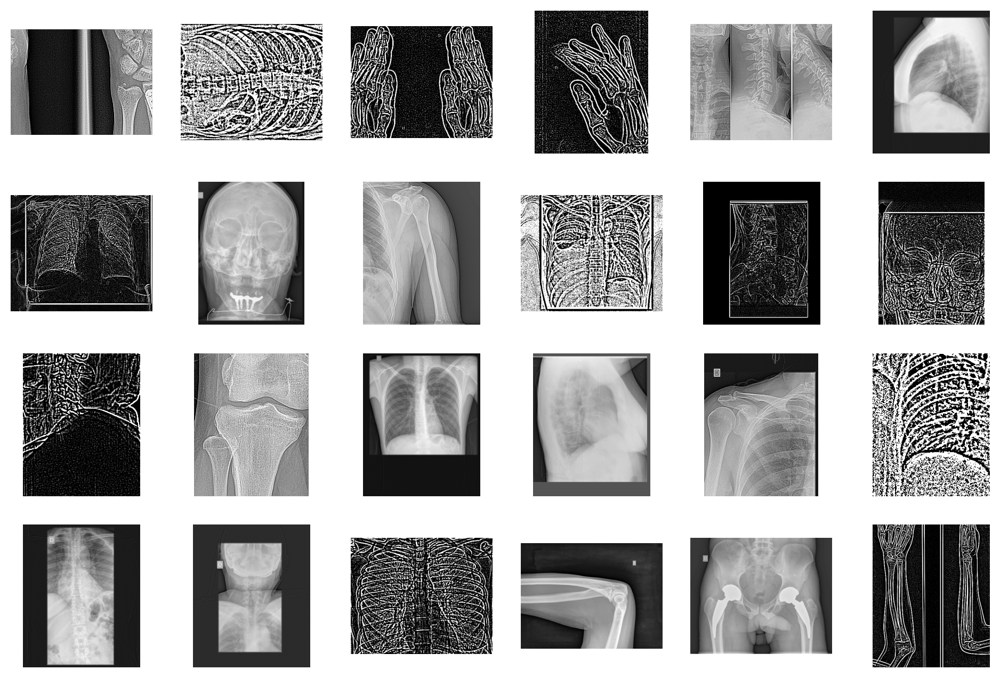

In [348]:
files = os.listdir('./archive/images/train/')
rand_files = random.choices(files, k=24)

fig, axes = plt.subplots(nrows=4, ncols=6, figsize=[12,8], dpi=200)
axes = axes.ravel()

for i in range(len(axes)):
    img = Image.open(os.path.join('./archive/images/train',rand_files[i]))
    axes[i].imshow(img, cmap=plt.cm.gray)
    axes[i].axis('off')

In [349]:
new_train_data = pd.DataFrame(new_train_data, columns=['Target', 'image_path'])
new_train_data

,Target,image_path
0,0,./archive/images/train/c-0-1.2.826.0.1.3680043...
1,0,./archive/images/train/c-1-1.2.826.0.1.3680043...
2,0,./archive/images/train/c-2-1.2.826.0.1.3680043...
3,0,./archive/images/train/c-3-1.2.826.0.1.3680043...
4,15,./archive/images/train/c-0-1.2.826.0.1.3680043...
...,...,...
6947,0,./archive/images/train/c-3-1.2.826.0.1.3680043...
6948,13,./archive/images/train/c-0-1.2.826.0.1.3680043...
6949,13,./archive/images/train/c-1-1.2.826.0.1.3680043...
6950,13,./archive/images/train/c-2-1.2.826.0.1.3680043...


In [350]:
train_df = pd.concat([train_df, new_train_data], ignore_index=True)
train_df

,image_path,Target
0,archive/images/train/1.2.826.0.1.3680043.8.498...,0
1,archive/images/train/1.2.826.0.1.3680043.8.498...,15
2,archive/images/train/1.2.826.0.1.3680043.8.498...,12
3,archive/images/train/1.2.826.0.1.3680043.8.498...,14
4,archive/images/train/1.2.826.0.1.3680043.8.498...,3
...,...,...
8685,./archive/images/train/c-3-1.2.826.0.1.3680043...,0
8686,./archive/images/train/c-0-1.2.826.0.1.3680043...,13
8687,./archive/images/train/c-1-1.2.826.0.1.3680043...,13
8688,./archive/images/train/c-2-1.2.826.0.1.3680043...,13


In [351]:


train, test = train_test_split(train_df[['image_path', 'Target']], test_size=0.1)
train.shape, test.shape

((7821, 2), (869, 2))

In [357]:
test.head()
test.shape

(869, 2)

In [293]:
train.head()

,image_path,Target
1070,archive/archive/archive/images/train/1.2.826.0...,2
6909,archive/archive/train/c-3-1.2.826.0.1.3680043....,2
7714,archive/archive/train/c-0-1.2.826.0.1.3680043....,2
4520,archive/archive/train/c-2-1.2.826.0.1.3680043....,15
5072,archive/archive/train/c-2-1.2.826.0.1.3680043....,21


## Model building

In [359]:
generator = ImageDataGenerator(rescale=1 / 255,   #Another way of creating data
                               rotation_range=10,
                               width_shift_range=0.25,
                               height_shift_range=0.25,
                               shear_range=0.2,
                               horizontal_flip=True,
                               vertical_flip=True,
                               samplewise_center=True,
                               samplewise_std_normalization=True,
                               validation_split=0.2,
                               preprocessing_function=pre_procrssing
                              )
test_generator = ImageDataGenerator(rescale=1 / 255,
                                    samplewise_center=True,
                                    samplewise_std_normalization=True)


In [360]:
train_datagen = generator.flow_from_dataframe(dataframe=train,
                                              x_col='image_path',
                                              y_col='Target',
                                              target_size=(224, 224),
                                              batch_size=32,
                                              #class_mode='categorical',
                                              color_mode='grayscale',
                                              subset='training',
                                              seed=48
                                             )

Found 6257 validated image filenames belonging to 22 classes.


In [361]:

valid_datagen = generator.flow_from_dataframe(dataframe=train,
                                              x_col='image_path',
                                              y_col='Target',
                                              target_size=( 224, 224),
                                              batch_size= 32,
                                              #class_mode='categorical',
                                              color_mode='grayscale',
                                              subset='validation',
                                              shuffle=False,
                                              seed=48)

Found 1564 validated image filenames belonging to 22 classes.


In [362]:
test_datagen = test_generator.flow_from_dataframe(dataframe=test,
                                                  x_col='image_path',
                                                  y_col='Target',
                                                  color_mode='grayscale',
                                                  batch_size=batch_size,
                                                  target_size=(input_size, input_size),
                                                  shuffle=False,
                                                  seed=48)

Found 869 validated image filenames belonging to 22 classes.


In [363]:
early_stop = tf.keras.callbacks.EarlyStopping(patience=25,
                                              monitor='val_loss',
                                              restore_best_weights=True,
                                              verbose=1)

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(patience=5,
                                                 monitor='val_loss',
                                                 factor=0.5,
                                                 verbose=1)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

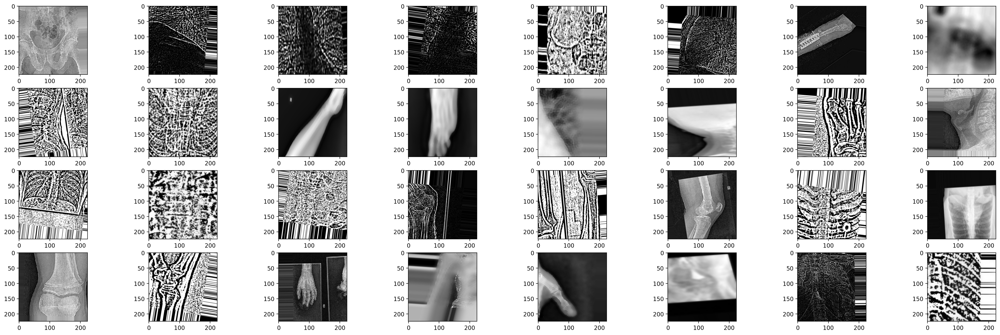

In [364]:
fig, axes = plt.subplots(nrows=4, ncols=8, figsize=[32, 10], dpi=200)
axes = axes.ravel()

for i, arr in enumerate(train_datagen.next()[0]):
    img = tf.keras.utils.array_to_img(arr)
    axes[i].imshow(img, cmap=plt.cm.gray)
    
plt.show()

In [365]:
input_size = 224
model_input = Input((input_size, input_size, 1))  # Input shape modified for single-channel images
feat_exc_input = Concatenate()([model_input, model_input, model_input])  # Concatenate to make it 3 channels
#Here we have used pretrained model Xception and made use of tranfer learing by making use of imagenet weights
feature_extractor =tf.keras.applications.Xception(include_top=False,
                                                   weights="imagenet",
                                                   input_tensor=feat_exc_input,
                                                  
                                                   
                                                  )  # Adjust number of groups if needed


model = Sequential([feature_extractor,
                    AveragePooling2D((3, 3)),
                    Flatten(),
                    Dense(units=22, activation='softmax')])

model.compile(optimizer=tf.keras.optimizers.Nadam(learning_rate=1e-3),
              loss=tf.keras.losses.CategoricalCrossentropy(),
              metrics=['accuracy', tfa.metrics.F1Score(num_classes=22, threshold=0.5)])

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [366]:
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 7, 7, 2048)        20861480  
                                                                 
 average_pooling2d_6 (Averag  (None, 2, 2, 2048)       0         
 ePooling2D)                                                     
                                                                 
 flatten_6 (Flatten)         (None, 8192)              0         
                                                                 
 dense_6 (Dense)             (None, 22)                180246    
                                                                 
Total params: 21,041,726
Trainable params: 20,987,198
Non-trainable params: 54,528
_________________________________________________________________


In [224]:
history = model.fit(train_datagen,
                    validation_data=valid_datagen,
                    batch_size=32,
                    epochs= 1,
                    callbacks=[early_stop,reduce_lr])

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 1/40 [..............................] - ETA: 7:46 - loss: 3.2817 - accuracy: 0.0000e+00 - f1_score: 0.0000e+00

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 2/40 [>.............................] - ETA: 2:41 - loss: 2.9457 - accuracy: 0.1719 - f1_score: 0.0036        

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 3/40 [=>............................] - ETA: 2:52 - loss: 2.6915 - accuracy: 0.2708 - f1_score: 0.0186

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 4/40 [==>...........................] - ETA: 2:45 - loss: 2.5444 - accuracy: 0.2969 - f1_score: 0.0240

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 5/40 [==>...........................] - ETA: 2:43 - loss: 2.4686 - accuracy: 0.3187 - f1_score: 0.0250

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 6/40 [===>..........................] - ETA: 2:40 - loss: 2.3642 - accuracy: 0.3542 - f1_score: 0.0269

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 7/40 [====>.........................] - ETA: 2:37 - loss: 2.2967 - accuracy: 0.3839 - f1_score: 0.0291

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 8/40 [=====>........................] - ETA: 2:32 - loss: 2.2448 - accuracy: 0.4219 - f1_score: 0.0303

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 9/40 [=====>........................] - ETA: 2:26 - loss: 2.1963 - accuracy: 0.4375 - f1_score: 0.0314

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

10/40 [======>.......................] - ETA: 2:20 - loss: 2.1242 - accuracy: 0.4500 - f1_score: 0.0327

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

11/40 [=======>......................] - ETA: 2:15 - loss: 2.1230 - accuracy: 0.4489 - f1_score: 0.0333

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

12/40 [========>.....................] - ETA: 2:09 - loss: 2.1164 - accuracy: 0.4479 - f1_score: 0.0336

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

13/40 [========>.....................] - ETA: 2:04 - loss: 2.0782 - accuracy: 0.4639 - f1_score: 0.0480

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

14/40 [=========>....................] - ETA: 1:59 - loss: 2.0275 - accuracy: 0.4777 - f1_score: 0.0562

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

15/40 [==========>...................] - ETA: 1:54 - loss: 1.9989 - accuracy: 0.4854 - f1_score: 0.0601

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

16/40 [===========>..................] - ETA: 1:49 - loss: 1.9614 - accuracy: 0.4902 - f1_score: 0.0663

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

17/40 [===========>..................] - ETA: 1:45 - loss: 1.9300 - accuracy: 0.4963 - f1_score: 0.0780

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

18/40 [============>.................] - ETA: 1:35 - loss: 1.9265 - accuracy: 0.4964 - f1_score: 0.0788

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

19/40 [=============>................] - ETA: 1:31 - loss: 1.9122 - accuracy: 0.4966 - f1_score: 0.0816

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

20/40 [==============>...............] - ETA: 1:26 - loss: 1.9100 - accuracy: 0.4935 - f1_score: 0.0797

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

21/40 [==============>...............] - ETA: 1:22 - loss: 1.9041 - accuracy: 0.4969 - f1_score: 0.0802

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

22/40 [===============>..............] - ETA: 1:18 - loss: 1.8970 - accuracy: 0.4970 - f1_score: 0.0835

<IPython.core.display.Javascript object>

23/40 [================>.............] - ETA: 1:14 - loss: 1.8943 - accuracy: 0.5000 - f1_score: 0.0874

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

24/40 [=================>............] - ETA: 1:09 - loss: 1.8622 - accuracy: 0.5054 - f1_score: 0.0950

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

25/40 [=================>............] - ETA: 1:05 - loss: 1.8481 - accuracy: 0.5078 - f1_score: 0.1018

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

26/40 [==================>...........] - ETA: 1:01 - loss: 1.8137 - accuracy: 0.5174 - f1_score: 0.1066

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

27/40 [===================>..........] - ETA: 56s - loss: 1.7939 - accuracy: 0.5203 - f1_score: 0.1128 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

28/40 [====================>.........] - ETA: 52s - loss: 1.7816 - accuracy: 0.5219 - f1_score: 0.1166

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

29/40 [====================>.........] - ETA: 48s - loss: 1.7614 - accuracy: 0.5267 - f1_score: 0.1201

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

30/40 [=====================>........] - ETA: 43s - loss: 1.7454 - accuracy: 0.5300 - f1_score: 0.1308

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

31/40 [======================>.......] - ETA: 39s - loss: 1.7256 - accuracy: 0.5353 - f1_score: 0.1383

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

32/40 [=======================>......] - ETA: 35s - loss: 1.7345 - accuracy: 0.5331 - f1_score: 0.1391

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

33/40 [=======================>......] - ETA: 30s - loss: 1.7267 - accuracy: 0.5350 - f1_score: 0.1382

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

34/40 [========================>.....] - ETA: 26s - loss: 1.7129 - accuracy: 0.5377 - f1_score: 0.1413

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

35/40 [=========================>....] - ETA: 21s - loss: 1.6887 - accuracy: 0.5440 - f1_score: 0.1442

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

36/40 [==========================>...] - ETA: 17s - loss: 1.6669 - accuracy: 0.5498 - f1_score: 0.1488

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

37/40 [==========================>...] - ETA: 13s - loss: 1.6619 - accuracy: 0.5502 - f1_score: 0.1521

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

38/40 [===========================>..] - ETA: 8s - loss: 1.6457 - accuracy: 0.5556 - f1_score: 0.1581 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

40/40 [==============================] - ETA: 0s - loss: 1.6293 - accuracy: 0.5623 - f1_score: 0.1679

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

40/40 [==============================] - 191s 5s/step - loss: 1.6293 - accuracy: 0.5623 - f1_score: 0.1679 - val_loss: 2.7005 - val_accuracy: 0.5192 - val_f1_score: 0.1311 - lr: 0.0010


In [226]:
model.evaluate(test_datagen)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 1/40 [..............................] - ETA: 37s - loss: 2.7451 - accuracy: 0.5000 - f1_score: 0.1070

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 2/40 [>.............................] - ETA: 29s - loss: 2.5562 - accuracy: 0.5312 - f1_score: 0.1190

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 3/40 [=>............................] - ETA: 28s - loss: 2.2476 - accuracy: 0.5417 - f1_score: 0.1141

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 4/40 [==>...........................] - ETA: 27s - loss: 2.1341 - accuracy: 0.5703 - f1_score: 0.1165

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 5/40 [==>...........................] - ETA: 26s - loss: 2.0539 - accuracy: 0.5625 - f1_score: 0.1270

<IPython.core.display.Javascript object>

 6/40 [===>..........................] - ETA: 25s - loss: 2.2089 - accuracy: 0.5521 - f1_score: 0.1223

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 7/40 [====>.........................] - ETA: 25s - loss: 2.3013 - accuracy: 0.5491 - f1_score: 0.1160

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 8/40 [=====>........................] - ETA: 24s - loss: 2.2814 - accuracy: 0.5586 - f1_score: 0.1278

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

 9/40 [=====>........................] - ETA: 23s - loss: 2.3399 - accuracy: 0.5556 - f1_score: 0.1261

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

10/40 [======>.......................] - ETA: 23s - loss: 2.3457 - accuracy: 0.5531 - f1_score: 0.1365

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

11/40 [=======>......................] - ETA: 22s - loss: 2.4799 - accuracy: 0.5426 - f1_score: 0.1390

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

12/40 [========>.....................] - ETA: 21s - loss: 2.4897 - accuracy: 0.5417 - f1_score: 0.1359

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

13/40 [========>.....................] - ETA: 20s - loss: 2.5464 - accuracy: 0.5457 - f1_score: 0.1389

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

14/40 [=========>....................] - ETA: 20s - loss: 2.4999 - accuracy: 0.5491 - f1_score: 0.1430

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

15/40 [==========>...................] - ETA: 19s - loss: 2.4199 - accuracy: 0.5542 - f1_score: 0.1561

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

16/40 [===========>..................] - ETA: 18s - loss: 2.3954 - accuracy: 0.5586 - f1_score: 0.1562

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

17/40 [===========>..................] - ETA: 17s - loss: 2.4489 - accuracy: 0.5515 - f1_score: 0.1522

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

18/40 [============>.................] - ETA: 17s - loss: 2.4497 - accuracy: 0.5469 - f1_score: 0.1503

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

19/40 [=============>................] - ETA: 16s - loss: 2.4630 - accuracy: 0.5461 - f1_score: 0.1513

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

20/40 [==============>...............] - ETA: 15s - loss: 2.4658 - accuracy: 0.5453 - f1_score: 0.1567

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

21/40 [==============>...............] - ETA: 14s - loss: 2.4394 - accuracy: 0.5491 - f1_score: 0.1630

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

22/40 [===============>..............] - ETA: 14s - loss: 2.4297 - accuracy: 0.5469 - f1_score: 0.1621

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

23/40 [================>.............] - ETA: 13s - loss: 2.4435 - accuracy: 0.5489 - f1_score: 0.1609

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

24/40 [=================>............] - ETA: 12s - loss: 2.4035 - accuracy: 0.5547 - f1_score: 0.1608

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

25/40 [=================>............] - ETA: 11s - loss: 2.4106 - accuracy: 0.5512 - f1_score: 0.1601

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

26/40 [==================>...........] - ETA: 10s - loss: 2.4134 - accuracy: 0.5505 - f1_score: 0.1593

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

27/40 [===================>..........] - ETA: 10s - loss: 2.4098 - accuracy: 0.5509 - f1_score: 0.1598

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

28/40 [====================>.........] - ETA: 9s - loss: 2.4306 - accuracy: 0.5502 - f1_score: 0.1584 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

29/40 [====================>.........] - ETA: 8s - loss: 2.4319 - accuracy: 0.5474 - f1_score: 0.1564

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

30/40 [=====================>........] - ETA: 7s - loss: 2.4186 - accuracy: 0.5469 - f1_score: 0.1543

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

31/40 [======================>.......] - ETA: 7s - loss: 2.4285 - accuracy: 0.5444 - f1_score: 0.1539

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

32/40 [=======================>......] - ETA: 6s - loss: 2.4341 - accuracy: 0.5420 - f1_score: 0.1523

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

33/40 [=======================>......] - ETA: 5s - loss: 2.4491 - accuracy: 0.5398 - f1_score: 0.1502

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

34/40 [========================>.....] - ETA: 4s - loss: 2.4312 - accuracy: 0.5441 - f1_score: 0.1533

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

35/40 [=========================>....] - ETA: 3s - loss: 2.4324 - accuracy: 0.5446 - f1_score: 0.1517

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

36/40 [==========================>...] - ETA: 3s - loss: 2.4304 - accuracy: 0.5434 - f1_score: 0.1537

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

37/40 [==========================>...] - ETA: 2s - loss: 2.4441 - accuracy: 0.5414 - f1_score: 0.1524

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

38/40 [===========================>..] - ETA: 1s - loss: 2.4410 - accuracy: 0.5411 - f1_score: 0.1556

<IPython.core.display.Javascript object>

40/40 [==============================] - 31s 776ms/step - loss: 2.4748 - accuracy: 0.5391 - f1_score: 0.1542


[2.4748175144195557,
 0.5391373634338379,
 array([0.05970149, 0.11764707, 0.        , 0.46583852, 0.        ,
        0.3908046 , 0.45714286, 0.        , 0.        , 0.13333334,
        0.        , 0.        , 0.14285715, 0.        , 0.1090909 ,
        0.819407  , 0.        , 0.        , 0.1724138 , 0.        ,
        0.        , 0.525     ], dtype=float32)]

In [227]:
test_preds = np.argmax(model.predict(test_datagen), axis=1)
pred_y = [{v:k for k,v in train_datagen.class_indices.items()}[k] for k in test_preds]
true_y = test.Target.values

In [228]:
acc_score_test = accuracy_score(true_y, pred_y)
conf_metric = confusion_matrix(true_y, pred_y, labels=list(train_datagen.class_indices.keys()))

In [229]:
acc_score_test


0.6724137931034483